<a href="https://colab.research.google.com/github/Lynxx39/Pemulihan-Citra-Blur-Menggunakan-Autoencoder-Berbasis-Deep-Learning-Menggunakan-Metode-CAE/blob/main/Deblur_Autoencoders_edited_18_june_00_00_CAE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# STEP 1: Upload kaggle.json
from google.colab import files
files.upload()  # 👉 Pilih file kaggle.json yang kamu unduh dari Kaggle (Settings > API)

# STEP 2: Konfigurasi token agar dikenali oleh Kaggle CLI
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# STEP 3: Install kaggle CLI
!pip install -q kaggle

# STEP 4: Download dataset TrashNet dari Kaggle
!kaggle datasets download -d kwentar/blur-dataset

# STEP 5: Ekstrak dataset ke folder dataset-resized
import zipfile
import os

dataset_dir = "/content"
os.makedirs(dataset_dir, exist_ok=True)

with zipfile.ZipFile("blur-dataset.zip", 'r') as zip_ref:
    zip_ref.extractall(dataset_dir)

print("✅ Dataset berhasil diekstrak")

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/kwentar/blur-dataset
License(s): CC0-1.0
 99% 1.48G/1.49G [00:11<00:00, 153MB/s]
100% 1.49G/1.49G [00:12<00:00, 133MB/s]
✅ Dataset berhasil diekstrak


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import random
import cv2
import os
import tensorflow as tf
from tqdm import tqdm # Digunakan untuk menampilkan progress bar saat loading data

# Impor layer Keras dari tensorflow.keras
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.layers import Conv2D, Flatten
from tensorflow.keras.layers import Reshape, Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K

In [ ]:
good_frames = '/content/blur_dataset_scaled/sharp'
bad_frames = '/content/blur_dataset_scaled/defocused_blurred'

In [ ]:
clean_frames = []
for file in tqdm(sorted(os.listdir(good_frames))):
    if any(extension in file for extension in ['.jpg', 'jpeg', '.png']):
        image = tf.keras.preprocessing.image.load_img(good_frames + '/' + file, target_size=(256,256))
        image = tf.keras.preprocessing.image.img_to_array(image).astype('float32') / 255
        clean_frames.append(image)

clean_frames = np.array(clean_frames)
blurry_frames = []
for file in tqdm(sorted(os.listdir(bad_frames))):
    if any(extension in file for extension in ['.jpg', 'jpeg', '.png']):
        image = tf.keras.preprocessing.image.load_img(bad_frames + '/' + file, target_size=(256,256))
        image = tf.keras.preprocessing.image.img_to_array(image).astype('float32') / 255
        blurry_frames.append(image)

blurry_frames = np.array(blurry_frames)

100%|██████████| 350/350 [00:10<00:00, 34.06it/s]


(256, 256, 3)
(256, 256, 3)
153


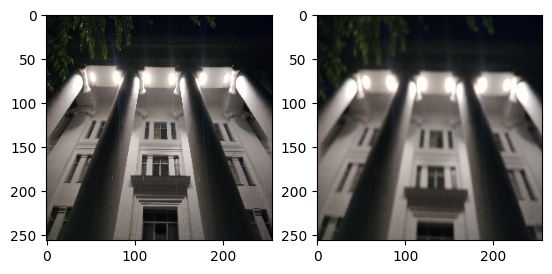

In [ ]:
seed = 21
random.seed = seed
np.random.seed = seed
# %%
x = clean_frames;
y = blurry_frames;
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
# %%
print(x_train[0].shape)
print(y_train[0].shape)
# %%
r = random.randint(0, len(clean_frames)-1)
print(r)
fig = plt.figure()
fig.subplots_adjust(hspace=0.1, wspace=0.2)
ax = fig.add_subplot(1, 2, 1)
ax.imshow(clean_frames[r])
ax = fig.add_subplot(1, 2, 2)
ax.imshow(blurry_frames[r])

In [ ]:
# Network Parameters
input_shape = (256, 256, 3)
batch_size = 32
kernel_size = 3
latent_dim = 256

# Encoder/Decoder number of CNN layers and filters per layer
# Increasing filters slightly
layer_filters = [64, 128, 256, 512] # Added one more layer with more filters

# %%
inputs = Input(shape = input_shape, name = 'encoder_input')
x = inputs
for filters in layer_filters:
    x = Conv2D(filters=filters,
               kernel_size=kernel_size,
               strides=2,
               activation='relu',
               padding='same')(x)
shape = K.int_shape(x)
x = Flatten()(x)
latent = Dense(latent_dim, name='latent_vector')(x)
encoder = Model(inputs, latent, name='encoder')
encoder.summary()

latent_inputs = Input(shape=(latent_dim,), name='decoder_input')
x = Dense(shape[1]*shape[2]*shape[3])(latent_inputs)
x = Reshape((shape[1], shape[2], shape[3]))(x)
for filters in layer_filters[::-1]:
    x = Conv2DTranspose(filters=filters,
                        kernel_size=kernel_size,
                        strides=2,
                        activation='relu',
                        padding='same')(x)

outputs = Conv2DTranspose(filters=3,
                          kernel_size=kernel_size,
                          activation='sigmoid',
                          padding='same',
                          name='decoder_output')(x)

# Print the shape after the last Conv2DTranspose layer
print("Shape after last Conv2DTranspose layer:", K.int_shape(outputs))

decoder = Model(latent_inputs, outputs, name='decoder')
decoder.summary()

autoencoder = Model(inputs, decoder(encoder(inputs)), name='autoencoder')
autoencoder.summary()

Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 131072)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent_vector (Dense)           │ (None, 256)            │    33,554,688 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 35,105,664 (133.92 MB)

 Trainable params: 35,105,664 (133.92 MB)

 Non-trainable params: 0 (0.00 B)

Shape after last Conv2DTranspose layer: (None, 256, 256, 3)


Model: "decoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ decoder_input (InputLayer)      │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 131072)         │    33,685,504 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 32, 32, 512)    │     2,359,808 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 64, 64, 256)    │     1,179,904 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 128, 128, 128)  │       295,040 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 256, 256, 64)   │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder_output                  │ (None, 256, 256, 3)    │         1,731 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 37,595,779 (143.42 MB)

 Trainable params: 37,595,779 (143.42 MB)

 Non-trainable params: 0 (0.00 B)

Model: "autoencoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ encoder_input (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ encoder (Functional)            │ (None, 256)            │    35,105,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ decoder (Functional)            │ (None, 256, 256, 3)    │    37,595,779 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 72,701,443 (277.33 MB)

 Trainable params: 72,701,443 (277.33 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Input, Conv2D, Flatten, Reshape, Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau
import numpy as np
import random
import os
import matplotlib.pyplot as plt
from tqdm import tqdm

# Define custom PSNR and SSIM metrics
def psnr(y_true, y_pred):
    max_pixel = 1.0  # Assuming pixel values are normalized between 0 and 1
    return tf.image.psnr(y_true, y_pred, max_val=max_pixel)

def ssim(y_true, y_pred):
    return tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

# Compile the autoencoder model with PSNR and SSIM as metrics
autoencoder.compile(loss='mse', optimizer='adam', metrics=[psnr, ssim])

lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=5,
                               verbose=1,
                               min_lr=0.5e-6)
callbacks = [lr_reducer]

history = autoencoder.fit(blurry_frames,
                      clean_frames,
                      validation_data=(blurry_frames, clean_frames),
                      epochs=100,
                      batch_size=batch_size,
                      callbacks=callbacks)

Epoch 1/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 61s 4s/step - loss: 0.0676 - psnr: 12.0887 - ssim: 0.3691 - val_loss: 0.0685 - val_psnr: 12.0120 - val_ssim: 0.3645 - learning_rate: 0.0010
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 31s 704ms/step - loss: 0.0697 - psnr: 11.9212 - ssim: 0.3445 - val_loss: 0.0671 - val_psnr: 12.0571 - val_ssim: 0.3644 - learning_rate: 0.0010
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 9s 561ms/step - loss: 0.0673 - psnr: 12.0293 - ssim: 0.3568 - val_loss: 0.0679 - val_psnr: 12.0261 - val_ssim: 0.3653 - learning_rate: 0.0010
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 547ms/step - loss: 0.0706 - psnr: 11.8593 - ssim: 0.3600 - val_loss: 0.0679 - val_psnr: 12.0350 - val_ssim: 0.3667 - learning_rate: 0.0010
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 6s 703ms/step - loss: 0.0668 - psnr: 12.1144 - ssim: 0.3567 - val_loss: 0.0652 - val_psnr: 12.2303 - val_ssim: 0.3532 - learning_rate: 0.0010
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 5s 548ms/step - loss: 0.0657 - psnr: 12.1908 - ssim: 0.3533 - val_los


       Input                        Ground Truth                  Predicted Value
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


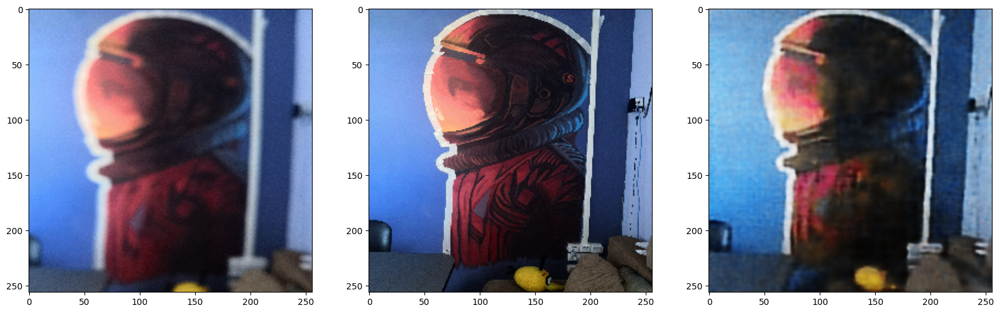

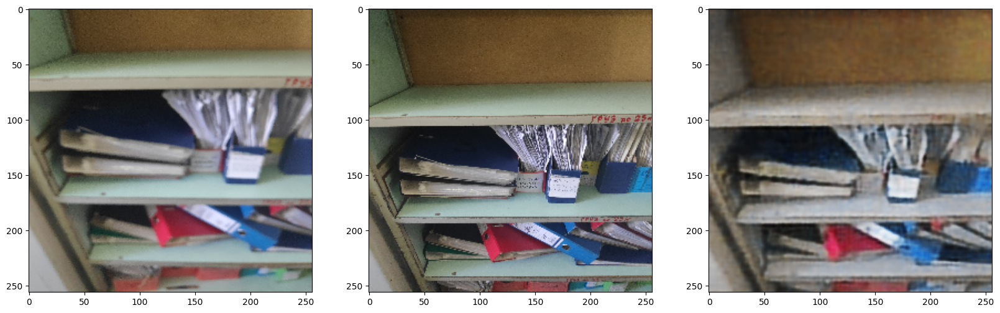

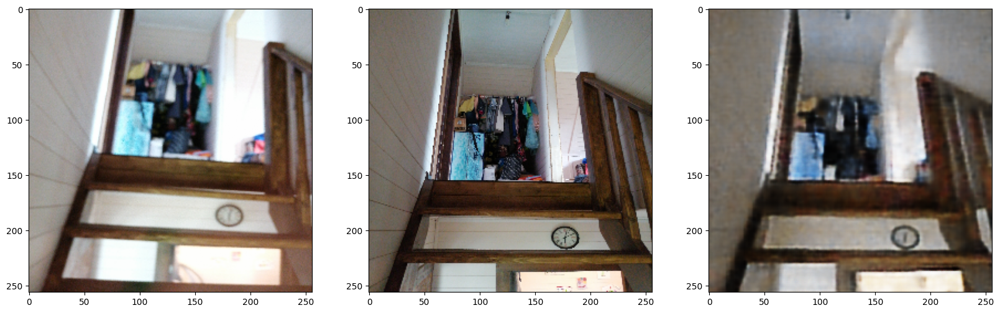

In [ ]:
print("\n       Input                        Ground Truth                  Predicted Value")
for i in range(3):

    r = random.randint(0, len(clean_frames)-1)

    x, y = blurry_frames[r],clean_frames[r]
    x_inp=x.reshape(1,256, 256,3)
    result = autoencoder.predict(x_inp)
    result = result.reshape(256,256,3)

    fig = plt.figure(figsize=(20,18))
    fig.subplots_adjust(hspace=0.1, wspace=0.2)

    ax = fig.add_subplot(1, 3, 1)
    ax.imshow(x)

    ax = fig.add_subplot(1, 3, 2)
    ax.imshow(y)

    ax = fig.add_subplot(1, 3, 3)
    plt.imshow(result)

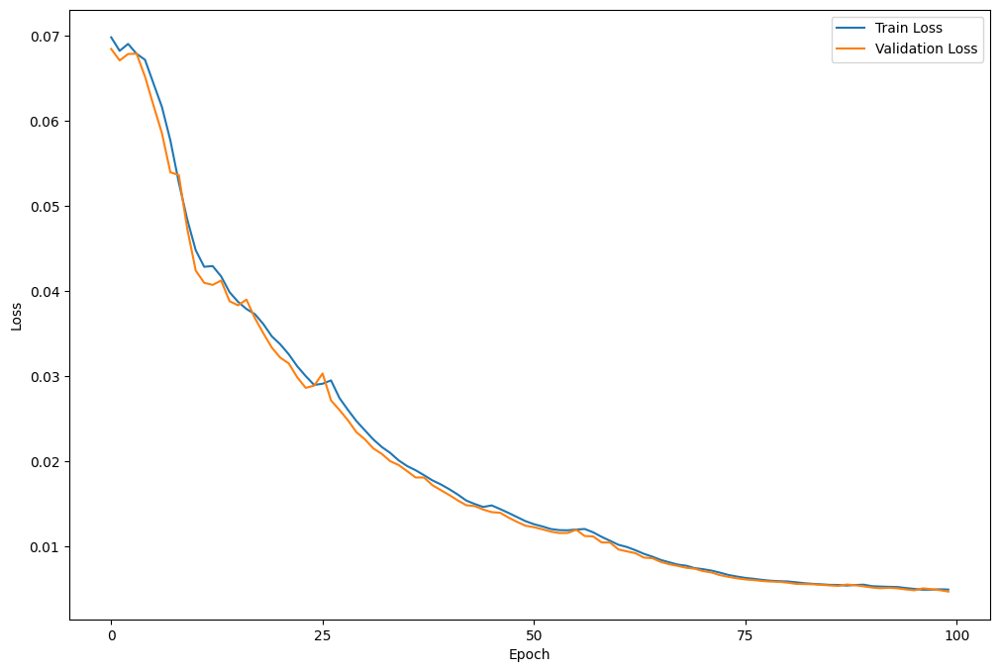

In [ ]:
# Plotting Loss
plt.figure(figsize=(12,8))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train Loss', 'Validation Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(0, 101, 25))
plt.show()

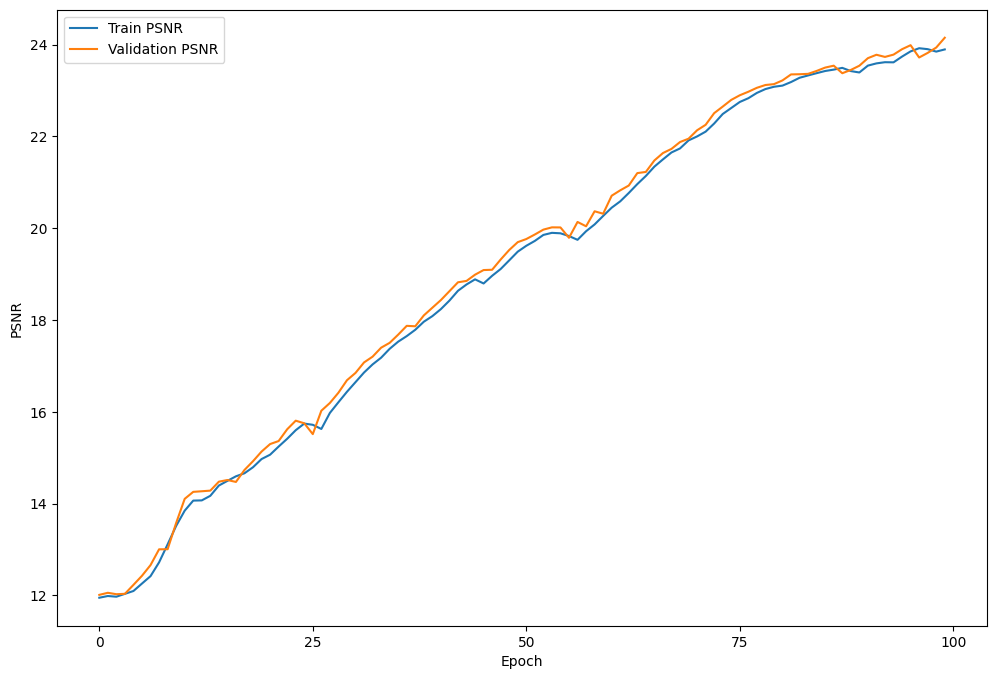

In [ ]:
# Plotting PSNR
plt.figure(figsize=(12,8))
plt.plot(history.history['psnr'])
plt.plot(history.history['val_psnr'])
plt.legend(['Train PSNR', 'Validation PSNR'])
plt.xlabel('Epoch')
plt.ylabel('PSNR')
plt.xticks(np.arange(0, 101, 25))
plt.show()

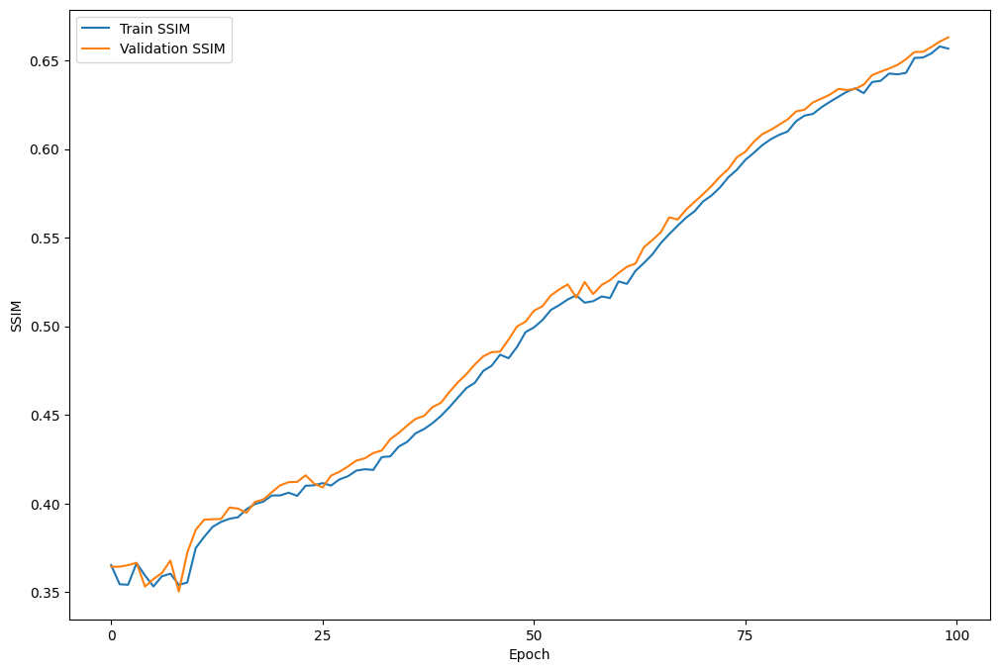

In [ ]:
# Plotting SSIM
plt.figure(figsize=(12,8))
plt.plot(history.history['ssim'])
plt.plot(history.history['val_ssim'])
plt.legend(['Train SSIM', 'Validation SSIM'])
plt.xlabel('Epoch')
plt.ylabel('SSIM')
plt.xticks(np.arange(0, 101, 25))
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


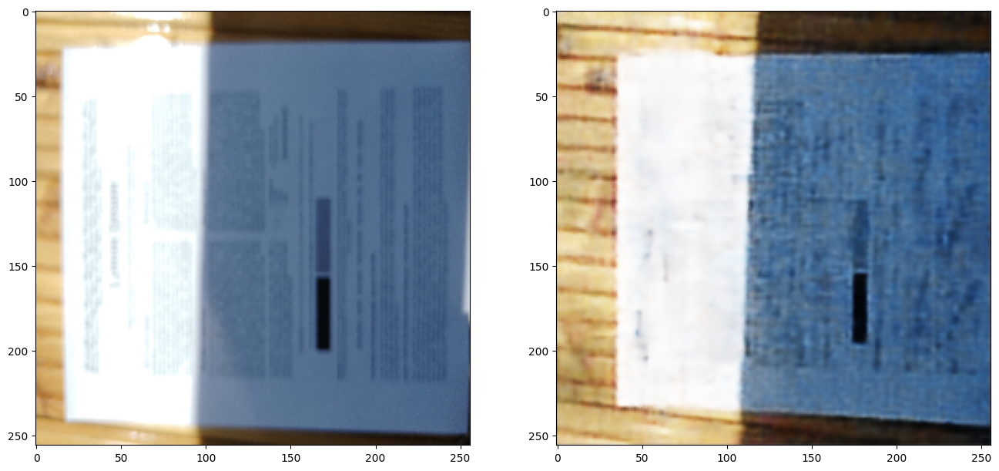

In [ ]:
def predict_result(test_img):
    predict = test_img.reshape(1,256,256,3)
    result =  autoencoder.predict(predict)
    result = result.reshape(256,256,3)

    fig = plt.figure(figsize = (16, 14))
    fig.subplots_adjust(hspace=0.1, wspace=0.2)
    ax = fig.add_subplot(1, 2, 1)
    ax.imshow(test_img)
    ax = fig.add_subplot(1, 2, 2)
    ax.imshow(result)

path_to_test = '/content/blur_dataset_scaled/defocused_blurred/103_HUAWEI-P20_F.jpg'
test_img = tf.keras.preprocessing.image.load_img(path_to_test, target_size=(256,256))
test_img = tf.keras.preprocessing.image.img_to_array(test_img).astype('float32') / 255
predict_result(test_img)


       Input                                               Ground Truth                                              Predicted Value
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


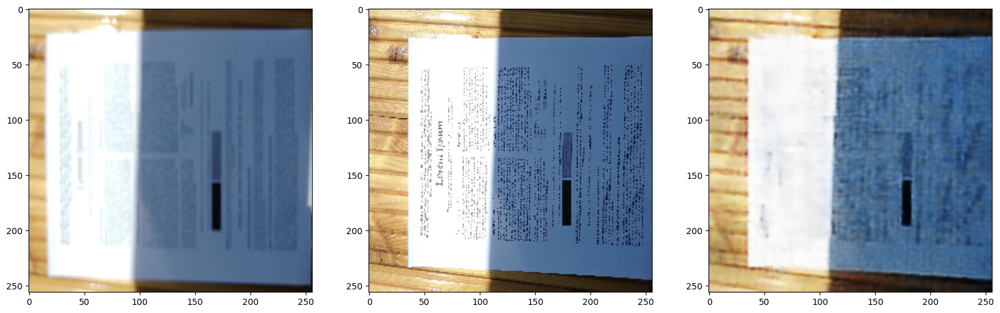

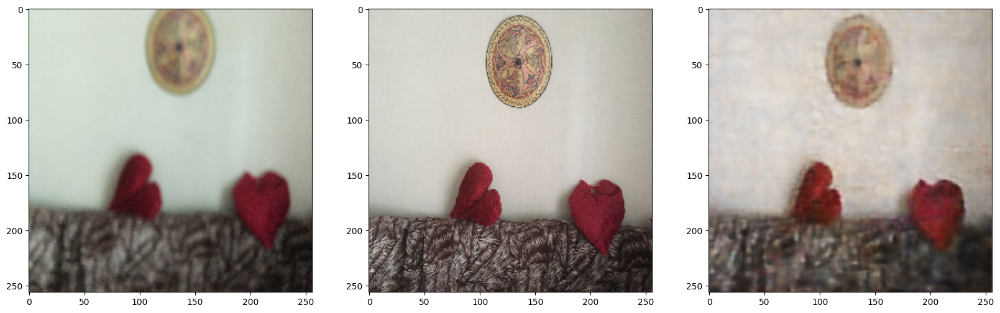

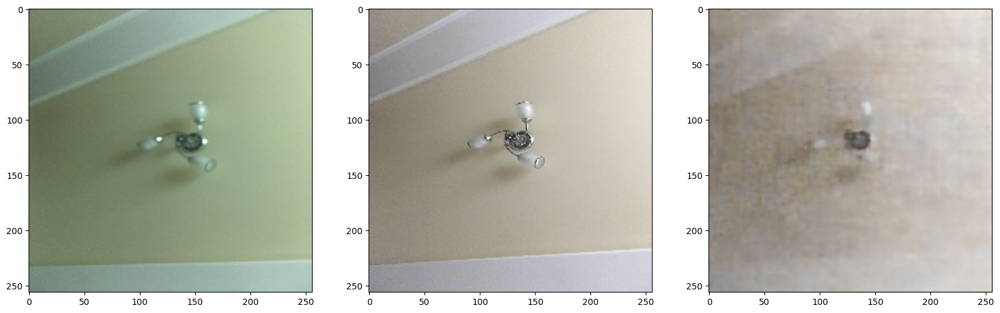

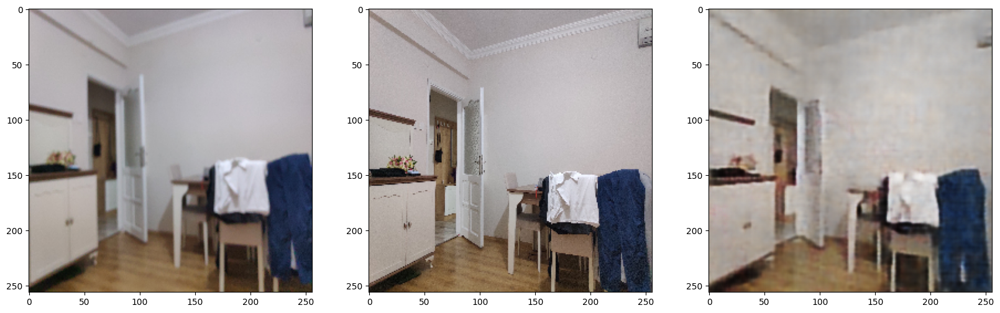

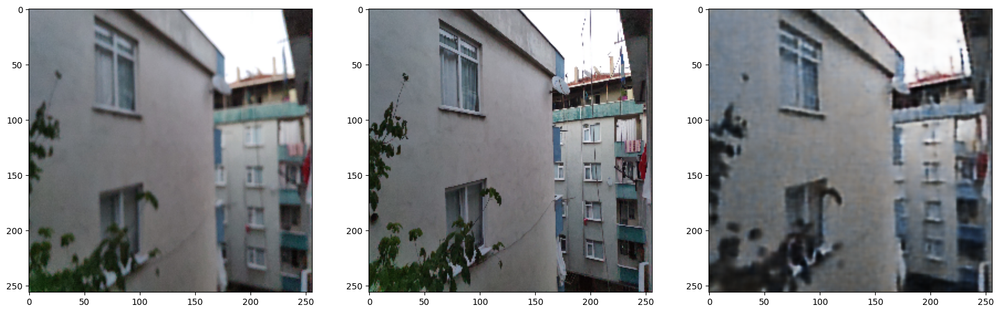

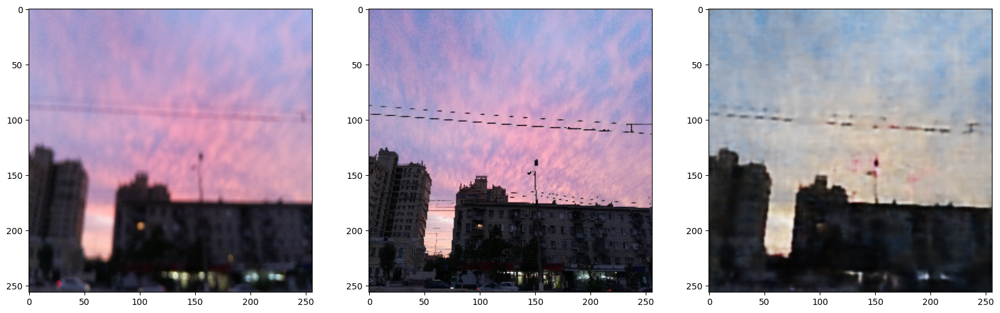

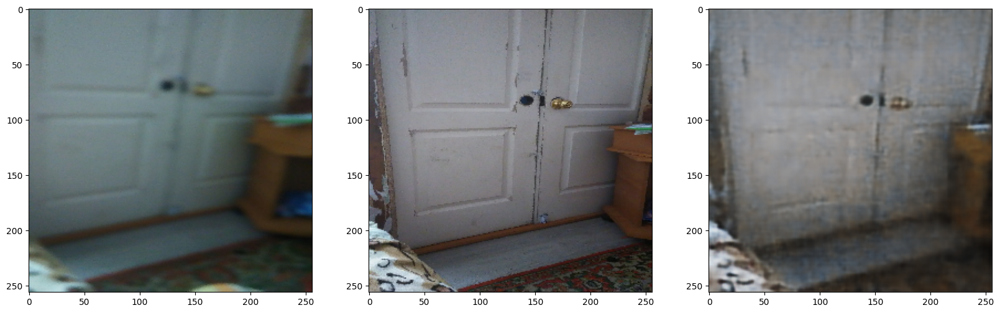

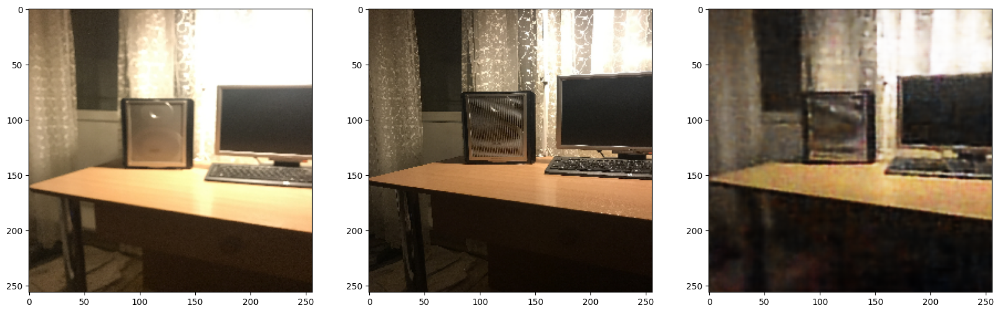

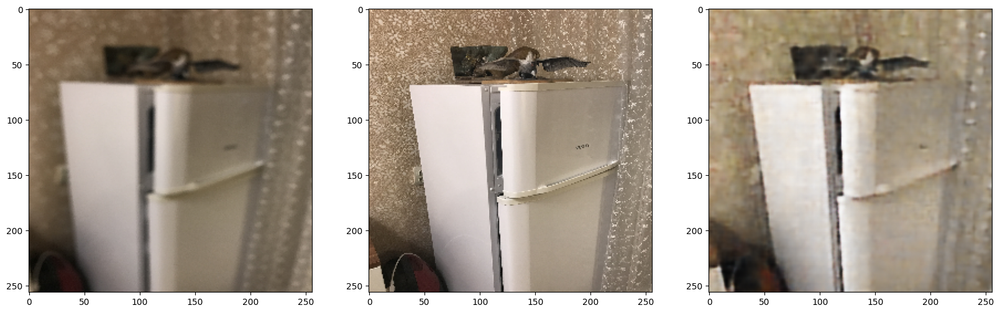

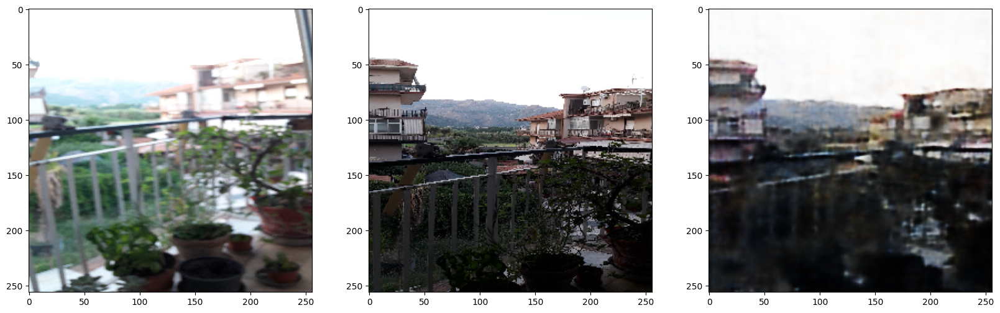

In [ ]:
print("\n       Input                                               Ground Truth                                              Predicted Value")
for i in range(10):


    x, y = blurry_frames[i],clean_frames[i]
    x_inp=x.reshape(1,256,256,3)
    result = autoencoder.predict(x_inp)
    result = result.reshape(256,256,3)

    fig = plt.figure(figsize=(20,18))
    fig.subplots_adjust(hspace=0.1, wspace=0.2)

    ax = fig.add_subplot(1, 3, 1)
    ax.imshow(x)

    ax = fig.add_subplot(1, 3, 2)
    ax.imshow(y)

    ax = fig.add_subplot(1, 3, 3)
    plt.imshow(result)

In [ ]:

# Define custom PSNR and SSIM metrics (needed to load the model)
def psnr(y_true, y_pred):
    max_pixel = 1.0  # Assuming pixel values are normalized between 0 and 1
    return tf.image.psnr(y_true, y_pred, max_val=max_pixel)

def ssim(y_true, y_pred):
    return tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

# Load the autoencoder model from the .h5 file
# Include 'mse' in custom_objects to handle the TypeError
loaded_autoencoder = tf.keras.models.load_model('autoencoder_deblurring_model.h5', custom_objects={'psnr': psnr, 'ssim': ssim, 'mse': tf.keras.losses.MeanSquaredError()})

Saving random.jpeg to random.jpeg
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619ms/step


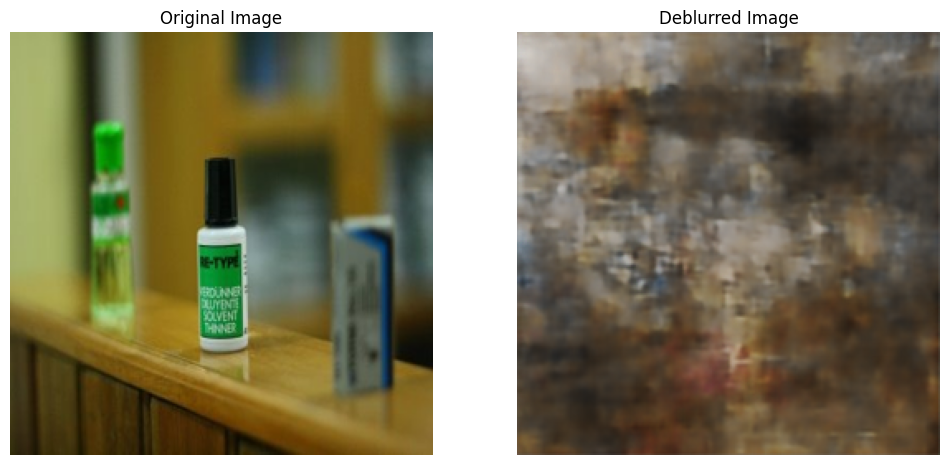

In [ ]:
from google.colab import files
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Unggah gambar dari komputer lokal
uploaded = files.upload()

for fn in uploaded.keys():
  # Baca gambar yang diunggah
  img = Image.open(fn).convert('RGB') # Pastikan gambar dalam format RGB
  img = img.resize((256, 256)) # Sesuaikan ukuran gambar dengan input model

  # Konversi gambar ke array numpy dan normalisasi
  img_array = np.array(img).astype('float32') / 255.0
  img_input = img_array.reshape(1, 256, 256, 3) # Ubah bentuk agar sesuai dengan input model

  # Prediksi menggunakan model autoencoder yang dimuat
  deblurred_img_array = loaded_autoencoder.predict(img_input)
  deblurred_img_array = deblurred_img_array.reshape(256, 256, 3) # Kembalikan ke bentuk gambar

  # Tampilkan gambar asli dan hasil deblurring
  fig, axes = plt.subplots(1, 2, figsize=(12, 6))
  axes[0].imshow(img_array)
  axes[0].set_title('Original Image')
  axes[0].axis('off')

  axes[1].imshow(deblurred_img_array)
  axes[1].set_title('Deblurred Image')
  axes[1].axis('off')

  plt.show()